# Trace Analysis

After compiling a number of observations from various programs and measuring their traces it time to analyzing the results to determine how the pupil position angle impacts the traces. 

`NOTE - this notebook is the third installment of this project where all of the analysis will be done.`

In [1]:
import time as t
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

import transitspectroscopy as ts

from jwst import datamodels
from scipy.interpolate import splev, splrep

from pathlib import Path

from astropy.io import fits
from astropy.visualization import (ImageNormalize, SqrtStretch, PowerStretch, 
                                   SinhStretch,AsinhStretch)

# here we are just carrying over the imports. 

In [2]:
sns.set_style('ticks')

In [3]:
plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = (15,5)

In [88]:
class Trace: 
    def __init__(self, x, y):
        self.x = x
        self.y = y

def load_soss_data():
    # load in the collected data the fits file
    with fits.open('../outputs/jwst_soss_obs_filtered_med_rateints.fits') as hdu:
        images = hdu[0].data
        pid_tags = hdu[1].data['pid'] 
        theta_pupil = hdu[1].data['pwcpos'] 
        theta_filter = hdu[1].data['filpos'] 
        traces_o1 = hdu[2].data
        traces_o2 = hdu[3].data
        traces_o3 = hdu[4].data
        
        print(images.shape)
        
    
    # sort the data by pupil position         
    sort_indicies = theta_pupil.argsort()
    pid_tags = pid_tags[sort_indicies]
    images = images[sort_indicies]
    theta_pupil = theta_pupil[sort_indicies]
    theta_filter = theta_filter[sort_indicies]
    
    # sort the traces
    traces_o1 = Trace(traces_o1[:,0], traces_o1[:, 1:].T[sort_indicies])
    traces_o2 = Trace(traces_o2[:,0], traces_o2[:, 1:].T[sort_indicies])
    traces_o3 = Trace(traces_o3[:,0], traces_o3[:, 1:].T[sort_indicies])
    
    return pid_tags, images, theta_pupil, theta_filter, traces_o1, traces_o2, traces_o3

In [89]:
pid_tags, tso_data, theta_pupil, theta_filter, traces_o1, traces_o2, traces_o3 = load_soss_data()

(15, 256, 2048)


In [8]:
tso_data.shape

(15, 256, 2048)

### Plot the data

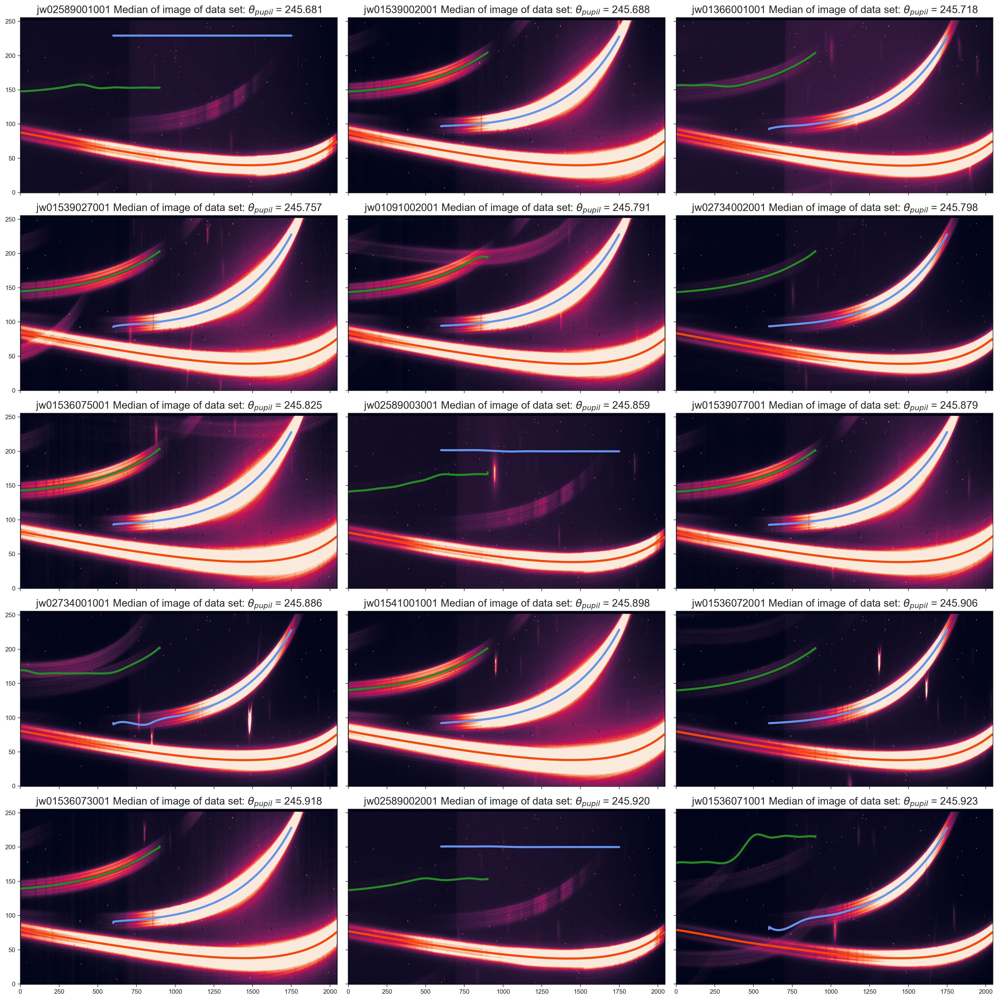

In [9]:
save_fig = False

ncols = 3
nrows = len(theta_pupil) //ncols  

stretch = AsinhStretch(0.5)
norm = ImageNormalize(vmin=2, vmax=50, stretch=stretch)

fig, axes = plt.subplots(nrows, ncols, figsize=(20,20), tight_layout=True, sharex=True, sharey=True)

for i, ax in enumerate(axes.ravel()):
    try:
        tso = tso_data[i]
        title = f'{pid_tags[i]} '+'Median of image of data set: $\\theta_{pupil}$ = ' + f'{theta_pupil[i]:.3f}'
        ax.set_title(title, fontsize=15)
        ax.imshow(tso, origin='lower', aspect='auto', vmin=2, vmax=30)
        ax.imshow(tso, origin='lower', aspect='auto', norm=norm)

        
        x1, y1 = traces_o1.x,  traces_o1.y[i]
        x2, y2 = traces_o2.x,  traces_o2.y[i]
        x3, y3 = traces_o3.x,  traces_o3.y[i]

        ax.plot(x1, y1, color = 'orangered', lw = 3)
        ax.plot(x2, y2, color = 'cornflowerblue', lw = 3)
        ax.plot(x3, y3, color = 'forestgreen', lw = 3)

    except:
        ax.axis('off')
if save_fig:
    plt.savefig('../figures/median_set_soss_data_w_traces.jpg', dpi=200)

plt.show()

In [ ]:
# order_2_good = [1, 2, 3, 4, 5, 6, 8, 9 ,10, 11, 12]

# Order 1 Trace Analysis

Based on initial inspection of the traces, traces of Order 1 have the best performing results, which to be expected. So we are going to start our analysis here for the time being. 

In order to really understand the impact, we need to identify trends which are dependent on the pupil wheel position angle. So, lets plots the traces as a function of position angle...

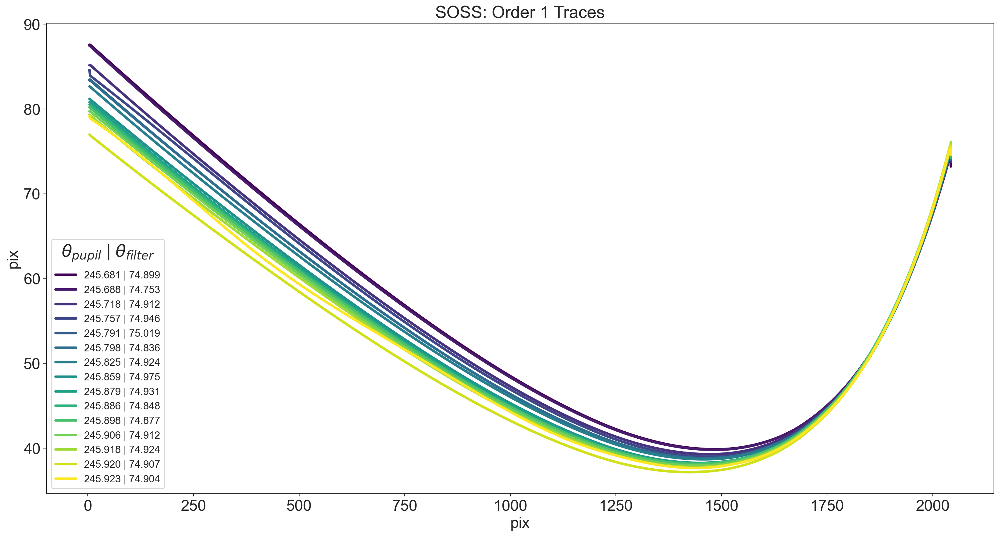

In [10]:
save_fig=False

colors = plt.cm.viridis(np.linspace(0, 1, theta_pupil.size))

plt.figure(figsize=(20,10))
plt.title('SOSS: Order 1 Traces', fontsize=20)
plt.xlabel('pix', fontsize=18)
plt.ylabel('pix', fontsize=18)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)

for i, (pwcpos, color) in enumerate(zip(theta_pupil, colors)):
    # order 1 trace
    x, y = traces_o1.x, traces_o1.y[i]
    plt.plot(x, y, lw=3, color=color, label=f'{pwcpos:.3f} | {theta_filter[i]:.3f}')

legend = plt.legend(fontsize=12, 
                    ncol=1,
                    title="$\\theta_{pupil}$ | $\\theta_{filter}$",)#, loc='center left', bbox_to_anchor=(1, 0.5))
legend.get_title().set_fontsize('20')
legend._legend_box.sep = 10
if save_fig:
    plt.savefig('../figures/03-all_order_1_trace_samples.jpg', dpi=200)
plt.show()

We can clear observe a trend in $\theta_{pupil}$ given the color gradient where the minimum position angle is the darkest color and the maximum position angle is the brightest. The second brightest is an outlier which we believe is due to misalignment with the source target. It is also apparent that there is a rotation point between pixels 1750-2000. By identifying the point at which the trace curve rotates about, we can calculate this rotation angle $\theta_{rot}$ is as a function of pupil position. 

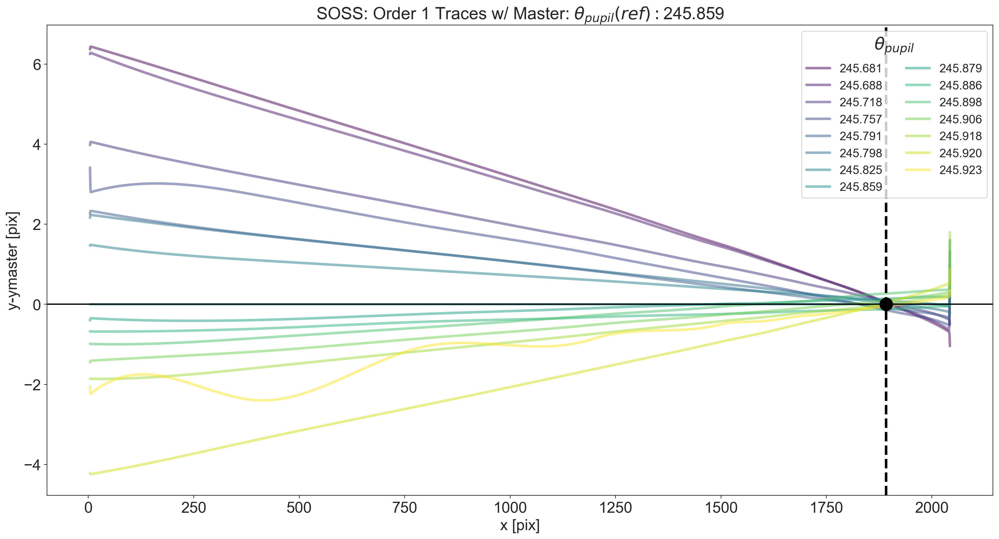

In [14]:
save_fig=False

i_master = np.searchsorted(theta_pupil, theta_pupil.mean())
y_master = traces_o1.y[i_master]
theta_pupil_master = theta_pupil[i_master]

colors = plt.cm.viridis(np.linspace(0, 1, theta_pupil.size))


plt.figure(figsize=(20,10))
plt.title('SOSS: Order 1 Traces w/ Master: $\\theta_{pupil} (ref): $'+f'{theta_pupil_master:.3f}', fontsize=20)
plt.xlabel('x [pix]', fontsize=18)
plt.ylabel('y-ymaster [pix]', fontsize=18)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)

x_intersect = []
y_intersect = []
for i, color in enumerate(colors):
    
    x, y = traces_o1.x, traces_o1.y[i]
    dy = y-y_master
    
#     index = np.argwhere(np.diff(np.sign(y - dy))).flatten()
#     index=np.argwhere(np.diff(np.sign(y_master - y))).flatten()
#     if 
#     print(index)
    index = np.abs(dy).argmin()
#     print(np.abs(dy[index-10:index+10]))
#     print(np.abs(dy[index]))
    x_intersect.append(x[index])
    y_intersect.append(dy[index])
    plt.plot(x, y-y_master, lw=3, color=color, alpha=0.5, label=f'{theta_pupil[i]:.3f}')

x_med = np.median(x_intersect)
y_med = np.median(y_intersect)

plt.axvline(x_med, color='k', lw=3, ls='--')
plt.axhline(0, color='k')
plt.plot(x_med, y_med, 'ko', color='k',markersize=15)

legend = plt.legend(fontsize=14, ncol=2, title="$\\theta_{pupil}$")#, loc='center left', bbox_to_anchor=(1, 0.5))
legend.get_title().set_fontsize('20')
legend._legend_box.sep = 10

if save_fig:
    plt.savefig('../figures/all_order_1_trace_samples.jpg', dpi=200)
plt.show()

In [16]:
# save_fig=False

# colors = plt.cm.viridis(np.linspace(0, 1, theta_pupil.size))

# plt.figure(figsize=(20,10))
# plt.title('SOSS: Order 1 Traces', fontsize=20)
# plt.xlabel('pix', fontsize=18)
# plt.ylabel('pix', fontsize=18)
# plt.xticks(fontsize=18)
# plt.yticks(fontsize=18)

# for i, (pwcpos, color) in enumerate(zip(theta_pupil, colors)):
#     # order 1 trace
#     x, y = traces_o1.x, traces_o1.y[i]
#     plt.plot(x, y, lw=3, color=color, label=f'{pwcpos:.3f} | {theta_filter[i]:.3f}')


# plt.xlim(1750, 2000)
# plt.ylim(40,60)
# legend = plt.legend(fontsize=12, 
#                     ncol=1,
#                     title="$\\theta_{pupil}$ | $\\theta_{filter}$",)#, loc='center left', bbox_to_anchor=(1, 0.5))
# legend.get_title().set_fontsize('20')
# legend._legend_box.sep = 10
# if save_fig:
#     plt.savefig('../figures/03-all_order_1_trace_samples.jpg', dpi=200)
# plt.show()

In [138]:
x_points = []
y_points = []

indices= np.arange(len(theta_pupil))
for i, y_trace in enumerate(traces_o1.y):
    dy = y_trace - traces_o1.y[np.where(indices != i)]
    index = np.argmin(np.abs(dy), axis=1)
#     print(index)
    x_points.append(traces_o1.x[index])
    y_points.append(traces_o1.y[i, index])
x_points = np.asarray(x_points).flatten()
y_points = np.asarray(y_points).flatten()

x_valid = x_points>1700

x_points = x_points[x_valid]
y_points = y_points[x_valid]

x_pt_mean = np.mean(x_points)
x_pt_median = np.median(x_points)

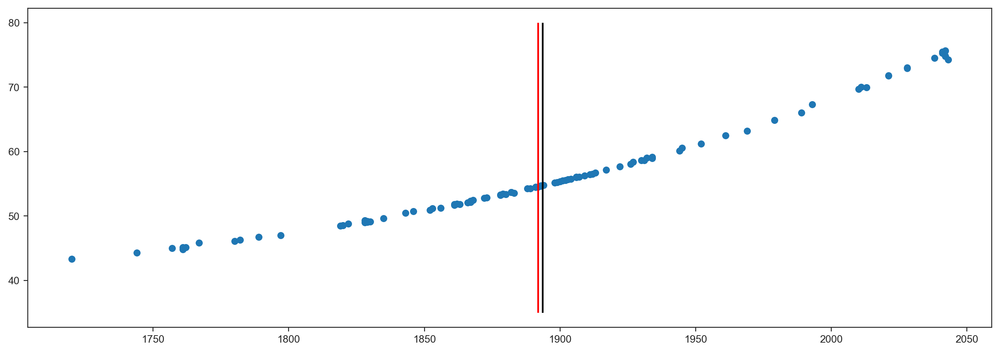

In [139]:
plt.scatter(x_points, y_points)
plt.vlines([x_pt_mean, x_pt_median], 35,80, colors=['k', 'r'])

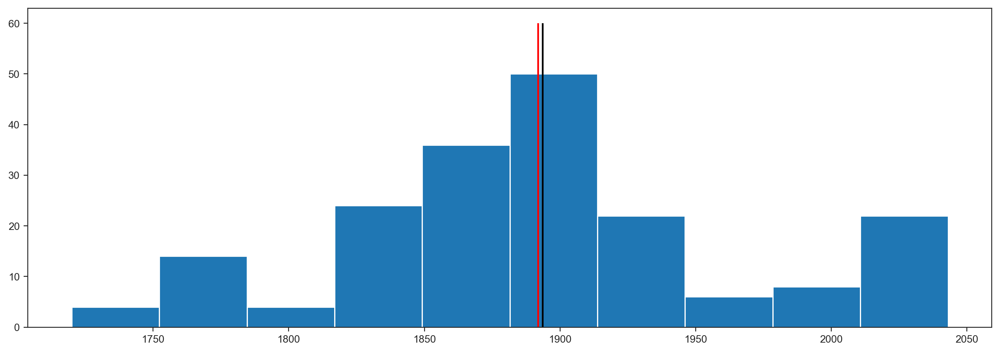

In [140]:
plt.hist(x_points[x_points>1600])
plt.vlines([x_pt_mean, x_pt_median], 0,60, colors=['k', 'r'])
plt.show()

In [141]:
x_pt_mean, x_pt_median

(1893.5894736842106, 1892.0)

In [142]:
np.mean(x_points), np.median(x_points)

(1893.5894736842106, 1892.0)

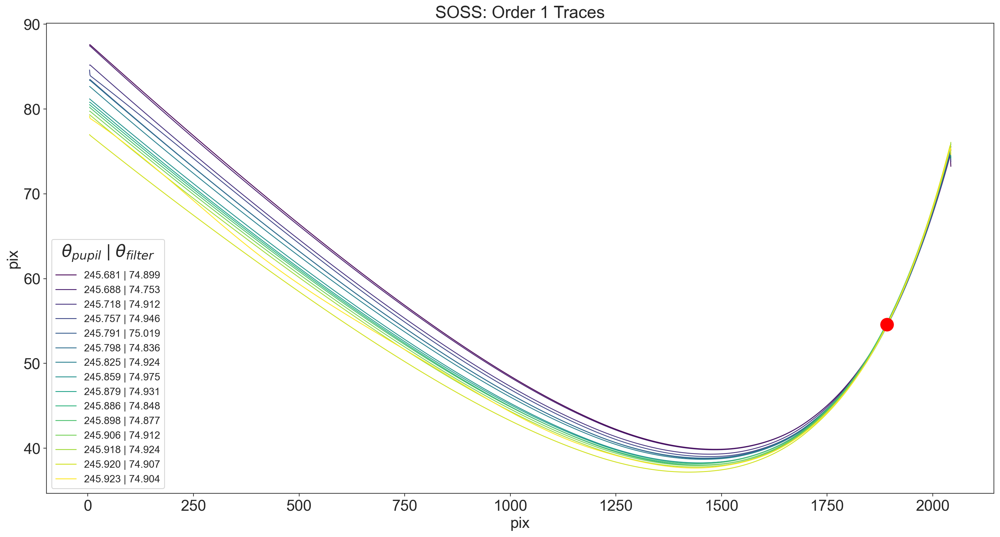

In [143]:
save_fig=False

ix_ref = np.where(traces_o1.x == x_pt_median)[0]#1892

colors = plt.cm.viridis(np.linspace(0, 1, theta_pupil.size))

plt.figure(figsize=(20,10))
plt.title('SOSS: Order 1 Traces', fontsize=20)
plt.xlabel('pix', fontsize=18)
plt.ylabel('pix', fontsize=18)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)

for i, (pwcpos, color) in enumerate(zip(theta_pupil, colors)):
    # order 1 trace
    x, y = traces_o1.x, traces_o1.y[i]
    plt.plot(x, y, lw=1, color=color, label=f'{pwcpos:.3f} | {theta_filter[i]:.3f}')

# plt.plot(np.median(x_points), np.median(y_points), 'ko', color='k',markersize=15)
plt.plot(traces_o1.x[ix_ref], traces_o1.y[0,ix_ref], 'o', color='r',markersize=15)
# plt.xlim(1750, 2000)
# plt.ylim(40,60)
legend = plt.legend(fontsize=12, 
                    ncol=1,
                    title="$\\theta_{pupil}$ | $\\theta_{filter}$",)#, loc='center left', bbox_to_anchor=(1, 0.5))
legend.get_title().set_fontsize('20')
legend._legend_box.sep = 10
if save_fig:
    plt.savefig('../figures/03-all_order_1_trace_samples.jpg', dpi=200)
plt.show()

In [144]:
print('Estimated pixel location corresponding to the rotation point of the trace:', np.median(x_points))

Estimated pixel location corresponding to the rotation point of the trace: 1892.0


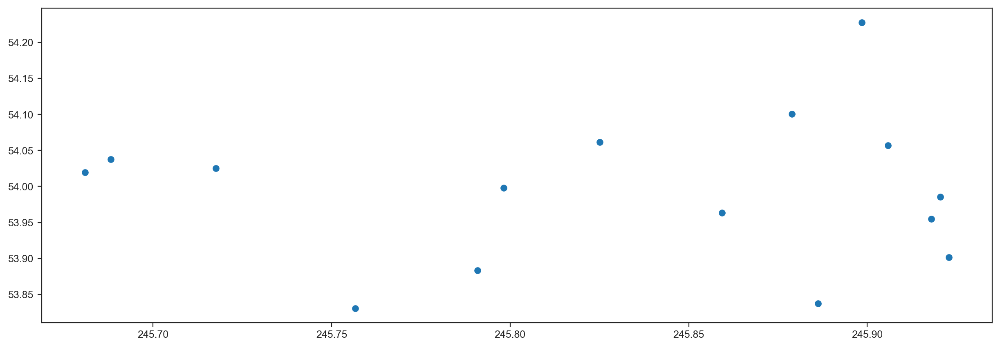

In [145]:
# Plot the data points corresponding to the rotation point

save_fig = False

plt.scatter(theta_pupil, traces_o1.y[:,1882])
plt.show()

In [146]:
traces_o1.y.shape

(15, 2040)

## Measure Curve Rotation

Next, is to calculate the trace rotation using the found pixel location as a reference point and the edges of the trace. Reference to calculation can be found [here](https://math.stackexchange.com/questions/1269050/finding-the-angle-between-two-line-equations). 

Let's visualize what this this looks like and calculate the rotation angle for a single trace...

1878


Text(0.5, 0, 'x [pix]')

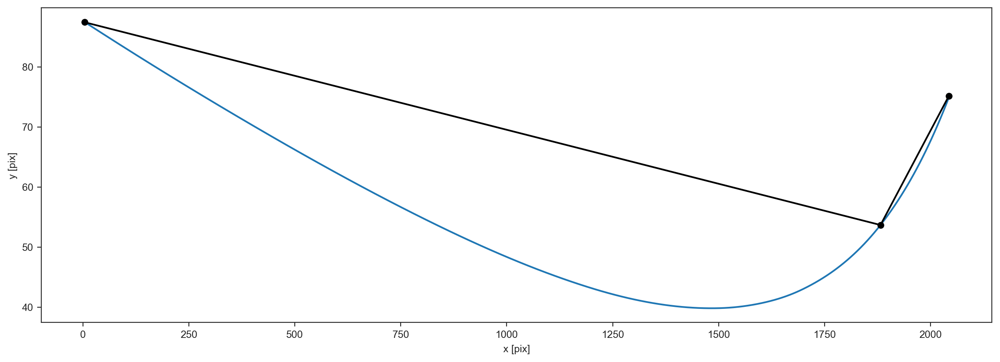

In [175]:
x_ref = 1882

x_test, y_test = traces_o1.x, traces_o1.y[1]

# i_ref = np.argmin(y_test)
i_ref = np.where(x_test == x_ref)[0][0]
print(i_ref)

x_points = [x_test[0], x_test[i_ref], x_test[-1]]
y_points = [y_test[0], y_test[i_ref], y_test[-1]]

plt.figure(figsize=(15,5))
plt.plot(x_test, y_test)
plt.plot(x_points, y_points, 'ko-')
plt.ylabel('y [pix]')
plt.xlabel('x [pix]')

In [176]:
# Calculate the rotation angle
# calcaulate the line slopes
dy = np.diff(y_points)
dx = np.diff(x_points)
m = dy/dx

# calculate the angle betweent the two lines
# pi - abs(arctan(m1) - arctan(m2))
theta_trace_rad = np.pi - np.abs(np.diff(np.arctan(m)))
theta_trace_deg = np.rad2deg(theta_trace_rad)

print('Curve Rotation for test trace [deg]: ', theta_trace_deg.round(2))

Curve Rotation for test trace [deg]:  [171.38]


Now let's do it for the rest of the traces...

In [177]:
display = False
theta_rot_degs = np.zeros(len(theta_pupil))

for i in range(len(theta_rot_degs)):
    
    #trace at order 1
    x, y = traces_o1.x, traces_o1.y[i]
    
#     i_ref = y.argmin()
    
    # three points to evaluate the rotation angle: traces egdes and mid-points
    # Right-edge sometimes has a sudden drop, to correct for using second to last element, not perfect.
    x_points = [x[0], x[i_ref], x[-1]] #if x[-1]>x[-2] else x[-2]]
    y_points = [y[0], y[i_ref], y[-1]] #if y[-1]>y[-2] else y[-2]]
    
    # display plots showing the points to be evaluated
    if display:
        plt.figure(figsize=(15,5))
        plt.plot(x, y)
        plt.plot(x_points, y_points, 'ko-')
        plt.ylabel('y [pix]')
        plt.xlabel('x [pix]')
        plt.show()
    
    # calcaulate the line slopes
    dy = np.diff(y_points)
    dx = np.diff(x_points)
    m = dy/dx
    
    # calculate the angle betweent the two lines
    # theta = pi - abs(arctan(m1) - arctan(m2))
    theta_rot_rad = np.pi - np.abs(np.diff(np.arctan(m)))
    theta_rot_deg = np.rad2deg(theta_rot_rad)
    theta_rot_degs[i] = theta_rot_deg
    print(f'theta (pupil | rot): {theta_pupil[i]:.3f} | {theta_rot_degs[i]:3f}')
#     print('Curve Rotation for test trace [deg]: ', theta_trace_deg.round(5))

theta (pupil | rot): 245.681 | 172.036280
theta (pupil | rot): 245.688 | 171.381174
theta (pupil | rot): 245.718 | 171.920794
theta (pupil | rot): 245.757 | 171.340882
theta (pupil | rot): 245.791 | 171.291626
theta (pupil | rot): 245.798 | 171.865671
theta (pupil | rot): 245.825 | 171.366216
theta (pupil | rot): 245.859 | 171.837232
theta (pupil | rot): 245.879 | 171.341711
theta (pupil | rot): 245.886 | 171.810180
theta (pupil | rot): 245.898 | 171.407491
theta (pupil | rot): 245.906 | 171.738418
theta (pupil | rot): 245.918 | 171.259709
theta (pupil | rot): 245.920 | 171.659439
theta (pupil | rot): 245.923 | 171.752719


Polyfit coef deg=1 [ -0.51060295 297.12207465]


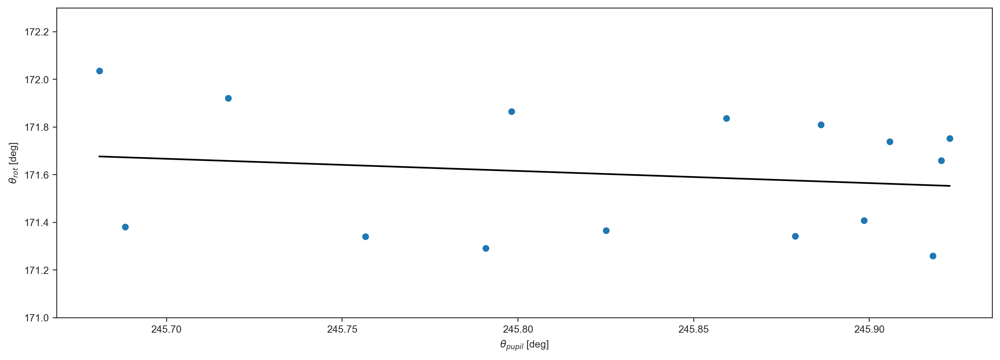

In [178]:
save_fig = False
coef = np.polyfit(theta_pupil, theta_rot_degs, deg=1)

print('Polyfit coef deg=1', coef)
p = np.poly1d(coef)

plt.figure(figsize=(15,5),dpi=200)
plt.scatter(theta_pupil, theta_rot_degs)
plt.plot(theta_pupil, p(theta_pupil), 'k')
plt.xlabel(r'$\theta_{pupil}$ [deg]')
plt.ylabel(r'$\theta_{rot}$ [deg]')
plt.ylim(171,172.3)
if save_fig:
    plt.savefig('../figures/trace_curve_rotation.jpg', dpi=200)
plt.show()

In [179]:
tso_data.shape

(15, 256, 2048)

### Linear Regression Model of traces as proposed by Nestor

In [63]:
# index to select the target theta
i_test = np.searchsorted(theta_pupil, np.mean(theta_pupil))

target_theta = theta_pupil[i_test] # This could be whatever target pupil wheel position we want
Y = traces_o1.y.T
degree=1

# now fit each column
coeffs = np.zeros((degree+1, Y.shape[0]))
prediction = np.zeros(Y.shape[0])
for i in range(Y.shape[0]):
    coeff = np.polyfit(theta_pupil, Y[i], degree)
    coeffs[:,i] = coeff
    prediction[i] = np.polyval(coeff, target_theta)

In [64]:
Y.shape

(2040, 15)

In [65]:
coeffs.T

array([[-3.51265423e+01,  8.71728972e+03],
       [-3.51317888e+01,  8.71851125e+03],
       [-3.51145079e+01,  8.71421760e+03],
       ...,
       [ 4.12559816e+00, -9.39136832e+02],
       [ 4.19794073e+00, -9.56800905e+02],
       [ 4.47762312e+00, -1.02583745e+03]])

In [67]:
target_theta

245.85933

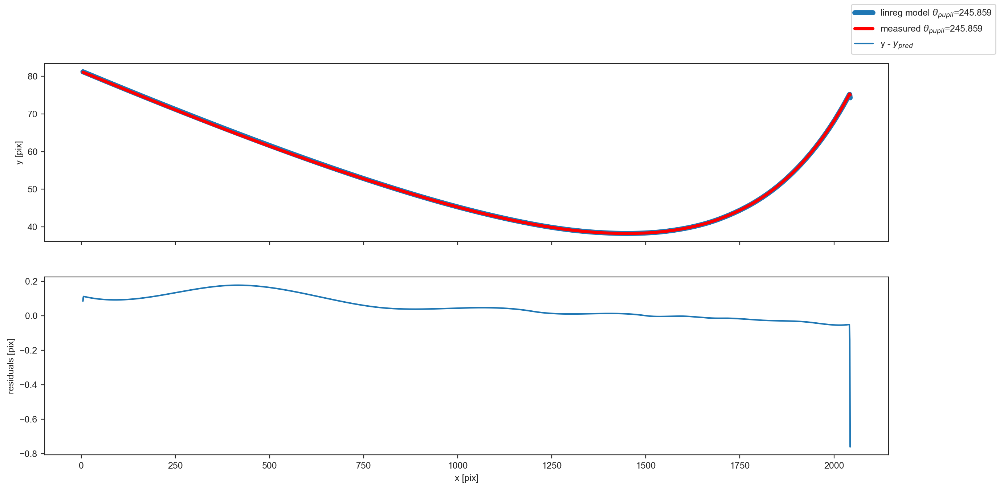

In [82]:
fig, (ax1, ax2) = plt.subplots(2,1, figsize=(15,7), sharex=True)
ax1.plot(x, Y.T[i_test], lw=5, label=f'linreg model $\\theta_{{pupil}}$={target_theta:.3f}')
ax1.plot(x, prediction, color='r', lw=3, label = f'measured $\\theta_{{pupil}}$={target_theta:.3f}' )
ax2.plot(x, Y.T[i_test]-prediction, label='y - $y_{pred}$')
ax2.set_xlabel('x [pix]')
ax1.set_ylabel('y [pix]')
ax2.set_ylabel('residuals [pix]')
fig.legend()
# plt.figure(figsize=(15,5))
# plt.plot(x, Y.T[i_test], label=f'linreg model $\\theta_{{pupil}}$={target_theta:.3f}')
# plt.plot(x, prediction, color='r', label = f'measured $\\theta_{{pupil}}$={target_theta:.3f}' )
# plt.xlabel('x [pix]')
# plt.ylabel('y [pix]')
# plt.legend()

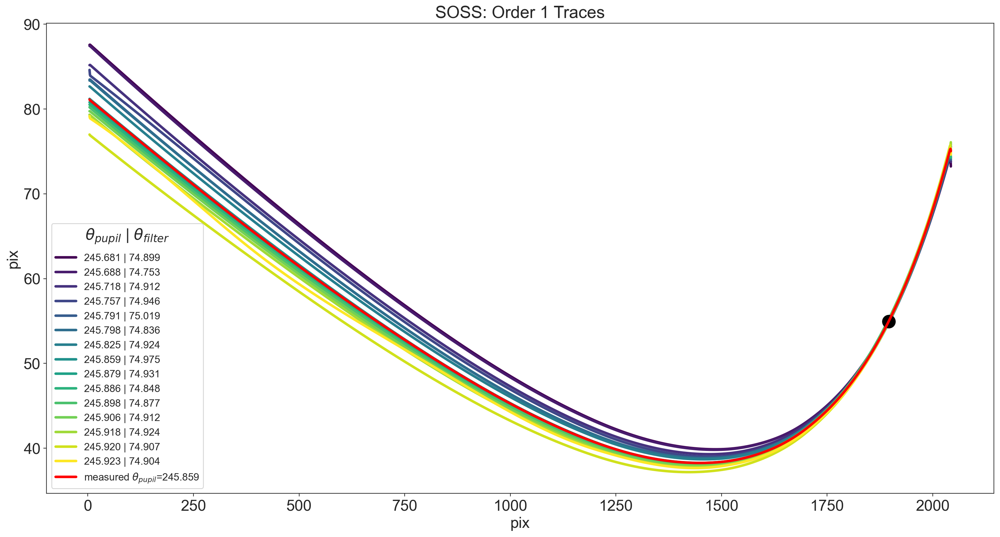

In [84]:
save_fig=False

ix_ref = 1892

colors = plt.cm.viridis(np.linspace(0, 1, theta_pupil.size))

plt.figure(figsize=(20,10))
plt.title('SOSS: Order 1 Traces', fontsize=20)
plt.xlabel('pix', fontsize=18)
plt.ylabel('pix', fontsize=18)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)

for i, (pwcpos, color) in enumerate(zip(theta_pupil, colors)):
    # order 1 trace
    x, y = traces_o1.x, traces_o1.y[i]
    plt.plot(x, y, lw=3, color=color, label=f'{pwcpos:.3f} | {theta_filter[i]:.3f}')


plt.plot(traces_o1.x[ix_ref], traces_o1.y[0,ix_ref], 'o', color='k',markersize=15)
plt.plot(x, prediction, color='r', lw=3,label = f'measured $\\theta_{{pupil}}$={target_theta:.3f}' )

legend = plt.legend(fontsize=12, 
                    ncol=1,
                    title="$\\theta_{pupil}$ | $\\theta_{filter}$",)#, loc='center left', bbox_to_anchor=(1, 0.5))
legend.get_title().set_fontsize('18')
legend._legend_box.sep = 10
if save_fig:
    plt.savefig('../figures/03-all_order_1_trace_samples.jpg', dpi=200)
plt.show()

# Order 2

In [94]:
from mpl_toolkits.axes_grid.inset_locator import (inset_axes, InsetPosition,
                                                  mark_inset)

In [90]:
# clean the data using only the good curves
order_2_good = [1, 2, 3, 4, 5, 6, 8, 9 ,10, 11, 12]
theta_pupil_order2 = theta_pupil.copy()[order_2_good]
traces_o2.y = traces_o2.y.copy()[order_2_good,:]

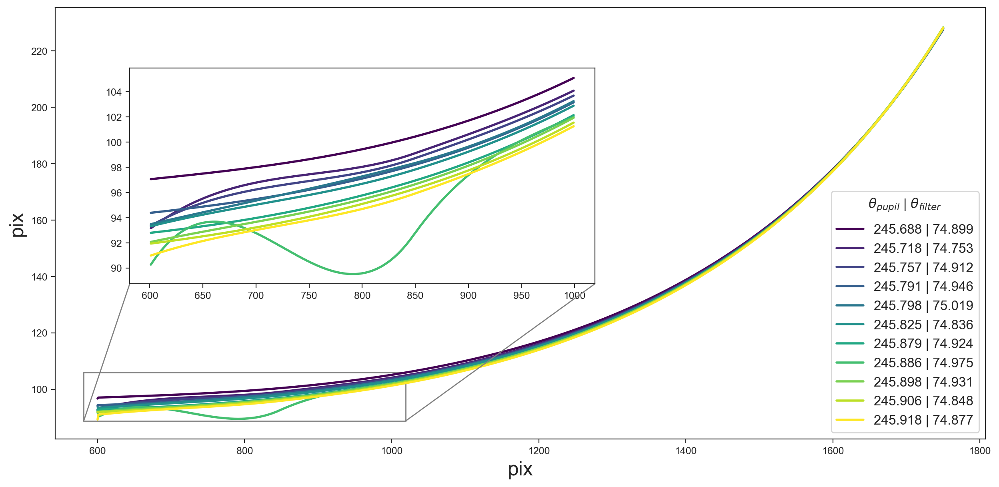

In [128]:
save_fig=False

fig, ax1 = plt.subplots(figsize=(15,7))

ax1.set_xlabel('pix', fontsize=18)
ax1.set_ylabel('pix', fontsize=18)

colors = plt.cm.viridis(np.linspace(0, 1, theta_pupil_order2.size))

for i, (pwcpos, color) in enumerate(zip(theta_pupil_order2, colors)):
    # order 1 trace
    x, y = traces_o2.x, traces_o2.y[i]
    ax1.plot(x, y, lw=2, color=color, label=f'{pwcpos:.3f} | {theta_filter[i]:.3f}')

   
    

legend = plt.legend(fontsize=12, 
                    ncol=1,
                    title="$\\theta_{pupil}$ | $\\theta_{filter}$", loc=4)#loc='center left', bbox_to_anchor=(1-0.1, 0.5))
legend.get_title().set_fontsize('12')
legend._legend_box.sep = 10

# them.
ax2 = plt.axes([0,0,1,1])
# Manually set the position and relative size of the inset axes within ax1
ip = InsetPosition(ax1, [0.08,0.36,0.5,0.5])
ax2.set_axes_locator(ip)

for i, (pwcpos, color) in enumerate(zip(theta_pupil_order2, colors)):
    # order 1 trace
    x, y = traces_o2.x, traces_o2.y[i]
    x_inset = (x>600) & (x<1000)
    ax2.plot(x[x_inset], y[x_inset], lw=2, color=color, label=f'{pwcpos:.3f} | {theta_filter[i]:.3f}')

# Mark the region corresponding to the inset axes on ax1 and draw lines
# in grey linking the two axes.
mark_inset(ax1, ax2, loc1=3, loc2=4, fc="none", ec='0.5') 

if save_fig:
    plt.savefig('../figures/03-all_order_1_trace_samples.jpg', dpi=200)
plt.show()

# Here we are going to repeat what we did for Order 1 looking at the trace rotation.

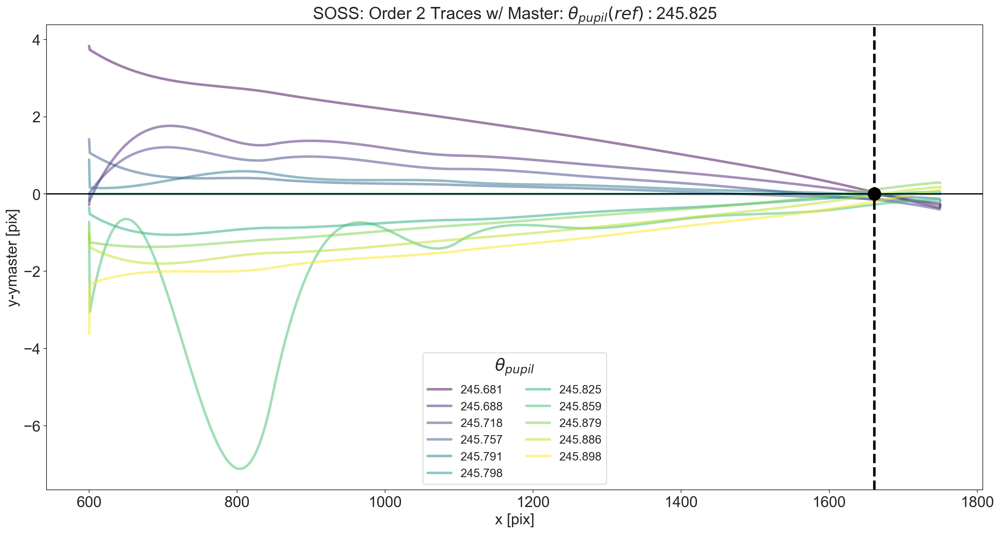

In [130]:
save_fig=False

i_master = np.searchsorted(theta_pupil_order2, theta_pupil_order2.mean())
y_master = traces_o2.y[i_master]
theta_pupil_master = theta_pupil_order2[i_master]


colors = plt.cm.viridis(np.linspace(0, 1, theta_pupil_order2.size))


plt.figure(figsize=(20,10))
plt.title('SOSS: Order 2 Traces w/ Master: $\\theta_{pupil} (ref): $'+f'{theta_pupil_master:.3f}', fontsize=20)
plt.xlabel('x [pix]', fontsize=18)
plt.ylabel('y-ymaster [pix]', fontsize=18)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)

x_intersect = []
y_intersect = []
for i, color in enumerate(colors):
    
    x, y = traces_o2.x, traces_o2.y[i]
    dy = y-y_master
    
#     index = np.argwhere(np.diff(np.sign(y - dy))).flatten()
#     index=np.argwhere(np.diff(np.sign(y_master - y))).flatten()
#     if 
#     print(index)
    index = np.abs(dy).argmin()
#     print(np.abs(dy[index-10:index+10]))
#     print(np.abs(dy[index]))
    x_intersect.append(x[index])
    y_intersect.append(dy[index])
    plt.plot(x, y-y_master, lw=3, color=color, alpha=0.5, label=f'{theta_pupil[i]:.3f}')

x_med = np.median(x_intersect)
y_med = np.median(y_intersect)

plt.axvline(x_med, color='k', lw=3, ls='--')
plt.axhline(0, color='k')
plt.plot(x_med, y_med, 'ko', color='k',markersize=15)

legend = plt.legend(fontsize=14, ncol=2, title="$\\theta_{pupil}$")#, loc='center left', bbox_to_anchor=(1, 0.5))
legend.get_title().set_fontsize('20')
legend._legend_box.sep = 10

if save_fig:
    plt.savefig('../figures/all_order_2_trace_samples.jpg', dpi=200)
plt.show()

1668.7021276595744 1670.0


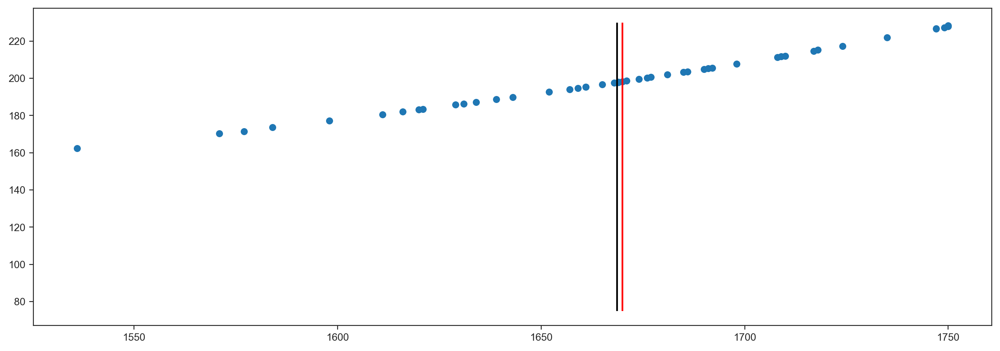

In [157]:
x_points = []
y_points = []

indices= np.arange(len(theta_pupil_order2))
for i, y_trace in enumerate(traces_o2.y):
    dy = y_trace - traces_o2.y[np.where(indices != i)]
    index = np.argmin(np.abs(dy), axis=1)
#     print(index)
    x_points.append(traces_o2.x[index])
    y_points.append(traces_o2.y[i, index])
x_points = np.asarray(x_points).flatten()
y_points = np.asarray(y_points).flatten()

x_valid = x_points>1500

x_points_valid = x_points[x_valid]
y_points_valid = y_points[x_valid]

x_pt_mean = np.mean(x_points_valid)
x_pt_median = np.median(x_points_valid)

plt.scatter(x_points_valid, y_points_valid)
plt.vlines([x_pt_mean, x_pt_median], 75,230, colors=['k', 'r'])

print(x_pt_mean, x_pt_median)

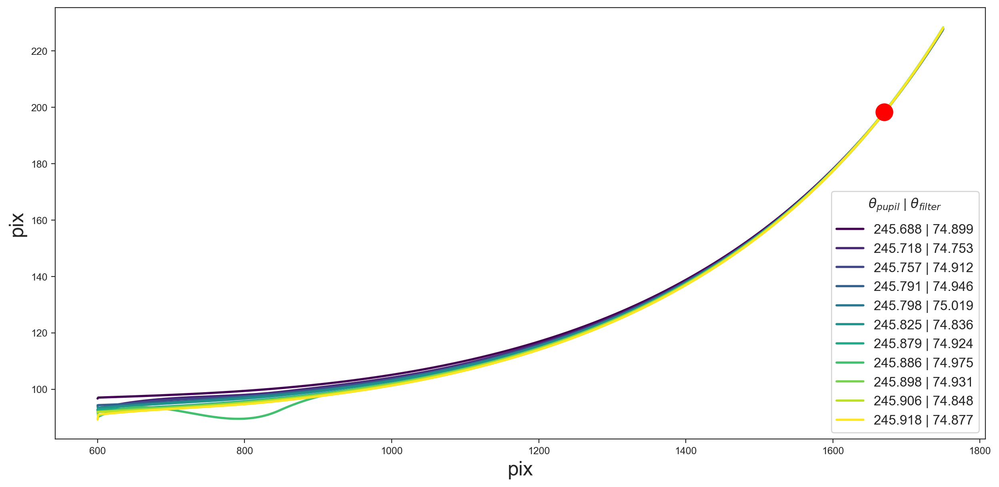

In [158]:
save_fig=False

ix_ref = np.where(traces_o2.x == x_pt_median)[0]

fig, ax1 = plt.subplots(figsize=(15,7))

ax1.set_xlabel('pix', fontsize=18)
ax1.set_ylabel('pix', fontsize=18)

colors = plt.cm.viridis(np.linspace(0, 1, theta_pupil_order2.size))

for i, (pwcpos, color) in enumerate(zip(theta_pupil_order2, colors)):
    # order 1 trace
    x, y = traces_o2.x, traces_o2.y[i]
    ax1.plot(x, y, lw=2, color=color, label=f'{pwcpos:.3f} | {theta_filter[i]:.3f}')

   

ax1.plot(traces_o2.x[ix_ref], traces_o2.y[0,ix_ref], 'o', color='r',markersize=15)    

legend = plt.legend(fontsize=12, 
                    ncol=1,
                    title="$\\theta_{pupil}$ | $\\theta_{filter}$", loc=4)#loc='center left', bbox_to_anchor=(1-0.1, 0.5))
legend.get_title().set_fontsize('12')
legend._legend_box.sep = 10

if save_fig:
    plt.savefig('../figures/03-all_order_1_trace_samples.jpg', dpi=200)
plt.show()




In [163]:
display = False
theta_rot_degs_order2 = np.zeros(len(theta_pupil_order2))

for i in range(len(theta_rot_degs_order2)):
    
    #trace at order 1
    x, y = traces_o2.x, traces_o2.y[i]
    
#     i_ref = y.argmin()
    
    # three points to evaluate the rotation angle: traces egdes and mid-points
    # Right-edge sometimes has a sudden drop, to correct for using second to last element, not perfect.
    x_points = [x[0], x[ix_ref][0], x[-1]] #if x[-1]>x[-2] else x[-2]]
    y_points = [y[0], y[ix_ref][0], y[-1]] #if y[-1]>y[-2] else y[-2]]

    # display plots showing the points to be evaluated
    if display:
        plt.figure(figsize=(15,5))
        plt.plot(x, y)
        plt.plot(x_points, y_points, 'ko-')
        plt.ylabel('y [pix]')
        plt.xlabel('x [pix]')
        plt.show()
    
    # calcaulate the line slopes
    dy = np.diff(y_points)
    dx = np.diff(x_points)
    m = dy/dx
    # calculate the angle betweent the two lines
    # theta = pi - abs(arctan(m1) - arctan(m2))
    theta_rot_rad = np.pi - np.abs(np.diff(np.arctan(m)))
    theta_rot_deg = np.rad2deg(theta_rot_rad)
    theta_rot_degs_order2[i] = theta_rot_deg
    print(f'theta (pupil | rot): {theta_pupil[i]:.3f} | {theta_rot_degs_order2[i]:3f}')
#     print('Curve Rotation for test trace [deg]: ', theta_trace_deg.round(5))

theta (pupil | rot): 245.681 | 165.191173
theta (pupil | rot): 245.688 | 165.413696
theta (pupil | rot): 245.718 | 165.326787
theta (pupil | rot): 245.757 | 165.210415
theta (pupil | rot): 245.791 | 165.259930
theta (pupil | rot): 245.798 | 165.223493
theta (pupil | rot): 245.825 | 165.203180
theta (pupil | rot): 245.859 | 165.192132
theta (pupil | rot): 245.879 | 165.193386
theta (pupil | rot): 245.886 | 165.158842
theta (pupil | rot): 245.898 | 165.213852


Polyfit coef deg=1 [ -0.51060295 297.12207465]


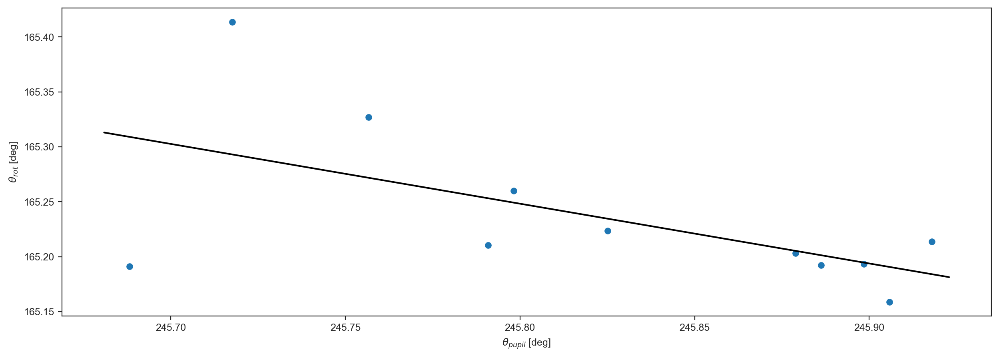

In [174]:
save_fig = False
coef_order2 = np.polyfit(theta_pupil_order2, theta_rot_degs_order2, deg=1)

print('Polyfit coef deg=1', coef)
p_order2 = np.poly1d(coef_order2)

plt.figure(figsize=(15,5),dpi=200)
plt.scatter(theta_pupil_order2, theta_rot_degs_order2)
plt.plot(theta_pupil, p_order2(theta_pupil), 'k')
plt.xlabel(r'$\theta_{pupil}$ [deg]')
plt.ylabel(r'$\theta_{rot}$ [deg]')
# plt.ylim(171,172.3)
if save_fig:
    plt.savefig('../figures/trace_curve_rotation.jpg', dpi=200)
plt.show()

# Lets compare the measured rotation angles of order 1 and order 2 corresponding to a given pupil position angle. 


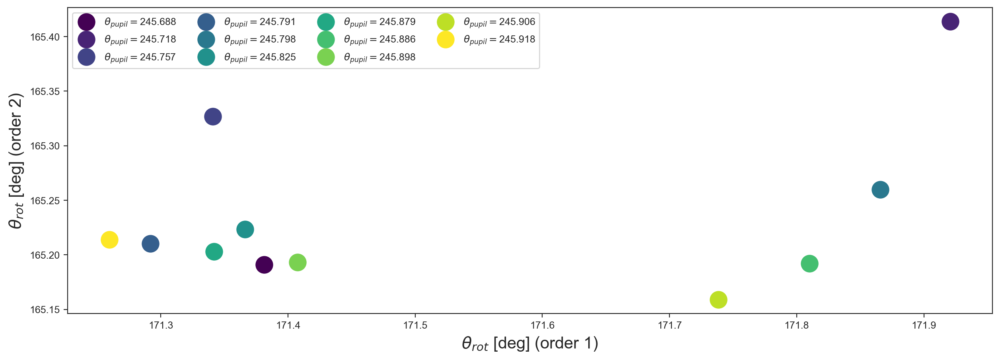

In [207]:


colors = plt.cm.viridis(np.linspace(0, 1, theta_pupil_order2.size))
for p1, p2, color, pwcpos in zip(theta_rot_degs[order_2_good], theta_rot_degs_order2, colors, theta_pupil_order2):
    plt.plot(p1, p2, 'o', color=color, markersize=15, label=f'$\\theta_{{pupil}}=${pwcpos:.3f}')
plt.xlabel('$\\theta_{rot}$ [deg] (order 1)', fontsize=15)
plt.ylabel('$\\theta_{rot}$ [deg] (order 2)', fontsize=15)
plt.legend(ncol=4)